# <center> **Customising Gymnasium Environments and RL Agents**

<div align="center">
    <img src="media/lunar_lander.gif" alt="Lunar_Lander" width="500">
</div>

## **Project Overview: Advanced Lunar Lander Mission Control**

In this assignment, we explore **Reinforcement Learning (RL)** by developing an autonomous agent capable of **piloting a Lunar Lander**. We utilize the **Stable-Baselines3 library** to train agents in both the **standard Gymnasium environment** and a **highly customised, resource-constrained simulation** designed to mimic realistic planetary exploration challenges.

**Objectives:**
1.  **Environment Customisation:** Extend **LunarLander-v3** with **stochastic physics (wind, variable gravity) and resource constraints (fuel consumption)**.
2.  **Agent Implementation:** Train and compare **Reinforcement Learning agents**.
3.  **Hyperparameter Tuning:** Evaluate **"Baseline" vs. "Tuned" configurations** to **optimize performance** in dynamic conditions.

## **The Environment: Lunar Lander**

We are using the **Lunar Lander-v3**, this environment is great for a **classic control problem** in the world of Reinforcement Learning.

- **The Goal:** The objective is to safely **navigate the spacecraft** from the top of the screen **to the landing pad on the lunar surface** (marked by two yellow flags at coordinates (0,0)). The **landing must be controlled and gentle to avoid crashing**.

- **The Challenge:** The lander **begins with a random initial velocity**. To succeed, the **agent must learn** to precisely **control the engines** to counteract gravity and momentum, **stabilizing the descent while managing fuel consumption**.

- **The Action Space:** The agent operates in a **Discrete(4) action space**. At every step must choose **exactly one of these four actions:**
    - **0: Do nothing**
    - **1: Fire left orientation engine**
    - **2: Fire main engine**
    - **3: Fire right orientation engine**

- **Observation Space:** The agent receives an **8-dimensional vector** of numerical data representing its **physical state** with indexes going through 0 to 7:
    - **$x$ : Horizontal Coordinate**
    - **$y$ : Vertical Coordinate**
    - **$v_x$ : Horizontal Velocity**
    - **$v_y$ : Vertical Velocity**
    - **$\theta$ : Angle (Orientation)**
    - **$\omega$ : Angular Velocity**
    - **$Leg_L$ : Left Leg Contact (Boolean 0 or 1)**
    - **$Leg_R$ : Right Leg Contact (Boolean 0 or 1)**

- **Reward Function:** The agent learns by trying to **maximize the total reward**. The **reward is calculated every step** based on the **following rules:**
    - **Distance: Reward increases the closer the lander is to the landing pad.**
    - **Velocity: Reward increases the slower the lander is moving (gentle landing).**
    - **Tilt: Reward decreases the more the lander is tilted (aiming for flatness).**
    - **Leg Contact: +10 points for each leg touching the ground.**
    - **Engine Penalty:**
        - **-0.03 points per frame if a side engine is firing.**
        - **-0.30 points per frame if the main engine is firing (simulating fuel cost).**
    - **Outcome:**
        - **+100 points for a safe landing.**
        - **-100 points for crashing.**
    - **Success: An episode is considered "solved" if the agent scores at least 200 points.**

- **Customization Arguments:** This environment allows us to **modify the following physics:**
    - **Gravity** set as **-10.0** as default.
    - **Enable_Wind** set as **False** as default.
    - **Wind_Power** representing **linear wind**.
    - **Turbulence_Power** representing **rotational wind**.


## **Setup & Imports**

Before we begin **implementing our agent**, we must **strictly define and set up our coding environment**.

In professional development, it is **highly recommended to create a dedicated Virtual Environment** for each project to avoid library conflicts. To make this **environment usable within our Jupyter Notebook**, we follow a **two-step process**:

- **Kernel Connection: We first install ipykernel**. This critical tool allows us to expose our virtual environment as a **selectable "Kernel" in Jupyter.**

- **Dependency Installation: Once the kernel is correctly linked, we install the specific project libraries**.

All project **dependencies are in a requirements.txt file**. This practice ensures **reproducibility**, allowing anyone to **recreate our environment exactly as intended.**

In [1]:
!pip install -q ipykernel

With the **virtual environment active and connected, we install the libraries directly from the file**.

In [30]:
!pip install -q -r requirements.txt

With our **environment set up and dependencies installed**, we now **import the necessary libraries** for the execution of our project.

We will use **Gymnasium to create the Lunar Lander simulation**, **Stable-Baselines3 to provide the Reinforcement Learning algorithms**, and **standard Python libraries for data handling and visualization.**

In [43]:
# Standard Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import animation
import seaborn as sns
import importlib
import os
import time
from IPython.display import HTML, display, Image
import imageio

#  Gymnasium
import gymnasium as gym
from gymnasium import spaces
from gymnasium.wrappers import RecordVideo

# Stable Baselines3
from stable_baselines3 import PPO, DQN
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.callbacks import EvalCallback
from sb3_contrib.common.maskable.policies import MaskableActorCriticPolicy
from sb3_contrib.common.wrappers import ActionMasker
from sb3_contrib.ppo_mask import MaskablePPO

## **Design Choices**

In this step we move beyond the standard simulation to create a **"Dynamic & Resource-Constrained"** environment. We are transitioning from a **static "video game" setting** to a **robust simulation that mimics the unpredictability of real planetary exploration**.

We will implement **three major changes** to the environment physics and logic:
1. **Dynamic Weather & Gravity (Domain Randomization):**
    - **Concept:** In the standard environment, gravity is always -10.0. **In our custom version, every episode will have different physics**.
    - **Implementation:** At the **start of every reset**, we will sample a **random gravity value and random wind profiles**. The agent must learn a **policy that generalizes** across these conditions, **rather than memorizing a single gravity constant.**
2. **Fuel Constraints:**
    - **Concept:** Infinite fuel is unrealistic. We will assign the lander a **random finite amount of fuel at the start of each mission**.
    - **Implementation:** We will **track fuel consumption**. If the counter hits zero, the **agent´s ability to use engines (actions 1 to 3) is disabled**, leaving it to drift helplessly. This forces the agent to **learn efficiency**.
3. **Landing Zone Uncertainty:**
    - **Concept:** The agent should **not assume the landing pad is always directly beneath it.**
    - **Implementation:** We will **randomize the initial coordinate of the spacecraft**. By **spawning the lander at random horizontal locations**, the "Landing Pad" (which remains at (0,0)) will appear in **different relative positions**, forcing the agent to **navigate laterally to find the target**.

Additionally, we will also implement a **Visual Costumization** to visually indicate in **which environment we are acting!**

All these **design choices are encapsulated within a custom Gymnasium wrapper, which is implemented in the Custom_Lunar_Lander.py module**.

### **Visual Comparison: Environments & Variables**

We will now **visually compare the differences between the two environments** and analyze their **key state variables (Gravity, Wind, Fuel, and Position) side-by-side**.

In [9]:
import Custom_Lunar_Lander
importlib.reload(Custom_Lunar_Lander)
from Custom_Lunar_Lander import make_custom_env

os.makedirs("media", exist_ok=True)

# Recording function
def record_episode_and_get_data(env, filename):
    obs, info = env.reset()
    frames = []

    telemetry = {
        "gravity": env.unwrapped.world.gravity[1],
        "wind": getattr(env.unwrapped, 'enable_wind', False),
        "fuel_display": f"{info['fuel_percentage']:.0f}%" if 'fuel_percentage' in info else "Infinite",
        "start_x": info.get('start_x', obs[0]),
    }

    for _ in range(120):
        action = env.action_space.sample()
        _, _, terminated, truncated, _ = env.step(action)
        frames.append(env.render())
        if terminated or truncated: break
    env.close()

    fig, ax = plt.subplots(figsize=(4, 3))
    ax.axis('off')
    img = ax.imshow(frames[0])
    def animate(i):
        img.set_data(frames[i])
        return [img]
    anim = animation.FuncAnimation(fig, animate, frames=len(frames), interval=50)
    anim.save(filename, writer='pillow', fps=30)
    plt.close()
    
    return telemetry

# Record one episode of each environment
print("Recording Original...")
env_orig = gym.make("LunarLander-v3", render_mode="rgb_array")
env_orig.unwrapped.enable_wind = False
data_orig = record_episode_and_get_data(env_orig, "media/original_side_by_side.gif")

print("Recording Custom...")
env_custom = make_custom_env(render_mode="rgb_array")
data_custom = record_episode_and_get_data(env_custom, "media/custom_side_by_side.gif")

# Print Data
print("\n" + "="*60)
print(f"{'METRIC':<15} | {'ORIGINAL':<20} | {'CUSTOM':<20}")
print("-" * 60)
print(f"{'Gravity':<15} | {data_orig['gravity']:<20.2f} | {data_custom['gravity']:<20.2f}")
print(f"{'Wind':<15} | {'OFF':<20} | {'ON':<20}")
print(f"{'Fuel':<15} | {data_orig['fuel_display']:<20} | {data_custom['fuel_display']:<20}")
print(f"{'Spawn X':<15} | {data_orig['start_x']:<20.2f} | {data_custom['start_x']:<20.2f}")
print("="*60 + "\n")

# Display
html_code = """
<div style="display: flex; justify-content: center; gap: 20px;">
    <div style="text-align: center;">
        <h3>Original</h3>
        <img src="media/original_side_by_side.gif" style="border: 2px solid grey; width: 300px;">
    </div>
    <div style="text-align: center;">
        <h3>Custom</h3>
        <img src="media/custom_side_by_side.gif" style="border: 2px solid blue; width: 300px;">
    </div>
</div>
"""
display(HTML(html_code))

Recording Original...
Recording Custom...


c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(



METRIC          | ORIGINAL             | CUSTOM              
------------------------------------------------------------
Gravity         | -10.00               | -10.16              
Wind            | OFF                  | ON                  
Fuel            | Infinite             | 90%                 
Spawn X         | -0.01                | 0.10                



This **comparison allows us to confirm:**

- **Visual Identity:** The **distinction** between the **Standard and our Custom "Deep Space" Planet**.

- **Telemetry Data:** The **active differences in Gravity (fixed vs. variable), Wind (inactive vs. active), and Fuel (infinite vs. finite)**.

- **Spawn Logic:** The **randomized starting positions** in the custom environment versus the **fixed center spawn in the original.**

## **Stable Baselines3 - Reinforcement Learning Agents**

### **Overview of Common Agents**

In this project, we rely on **Stable-Baselines3**, a robust **library of Reinforcement Learning algorithms** implemented in PyTorch. Before training, it is **essencial to understand the algorithms available and justify our selection**.

- **PPO (Proximal Policy Optimization):**
    - **Type: On-Policy, Policy Gradient**.
    - **Work the best on: Versatile tasks (discrete & continuous)**.
    - **Concept: PPO is currently the industry standard for general-purpose RL**. It **improves stability** by limiting how much the policy can change in a single update ("clipping"), **preventing the agent from making drastic mistakes that destroy its learning process**.

- **DQN (Deep Q-Network):**
    - **Type: Off-Policy, Value-Based**.
    - **Work the best on: Discrete action spaces**.
    - **Concept: DQN learns the "Value" (Q-Value) of taking a specific action in a specific state**. It uses a **"Replay Buffer" to store past experiences and learn from them repeatdly**, making it very sample-efficient for simple environments.

- **A2C (Advantage Actor Critic):**
    - **Type: On-Policy, Hybrid (Actor-Critic)**.
    - **Work the best on: Parallelized training**.
    - **Concept: A synchronous versions of the classic Actor-Critic architecture**. It fits a **value function (Critic) to estimate rewards and a policy function (Actor) to select actions**. While faster than PPO in wall-clock time, it is often less sample-efficient and more unstable.

### **Our Selection: PPO & DQN**

For the **Lunar Lander (Discrete) environment we decided to select PPO and DQN**.
 
- **Why PPO?** It is our **"safe bet"**. Its **stability makes it robust against the random noise we introduced (wind, gravity)**, allowing it to **converge reliably** even in our dynamic Custom Environment.

- **Why DQN?** Since Lunar Lander has a **discrete action space (4 buttons), DQN is theoretically ideal**. It is historically famous for solving video-game.like control tasks and offers a strong contrast to PPO's policy-gradient approach.

- **Why not DDPG/SAC?** These algorithms are **designed for *Continuous* action spaces**, which is not our case, to be able to use them would require converting the Lunar Lander to continuous mode.

### **Hyperparameter Configuration**

To **evaluate performance** we will train **each agent with two distinct configurations**. These settings are **defined in our *configs.py* file**.

- **PPO Configurations:** We test a **standard "Baseline" against an "Advanced" configuration designed for long-term stability in the custom environment**.

    - **Settings 1 (Baseline):**
        - **Learning Rate:** $3 \times 10^{-4}$
        - **Network: Standard MLP**
        - **Gamma:** $0.99$
        - **GAE Lambda:** $0.95$

    - **Settings 2 (Advanced):**
        - **Network Architecture:** $[256,256]$ **(increased capacity)**
        - **Gamma:** $0.995$
        - **GAE Lambda:** $0.98$
        - **Clip Range:** $0.15$

    - **Change Impact:**
        - **Network Architecture:** The **"Big Brain" upgrade provides a deeper neural network to capture the complex relationships between fuel levels, wind forces, and gravity**.
        - **Gamma:** A **higher discount factor focuses the agent on the final landing safety** rather than immediate stabilization rewards.
        - **GAE Lambda:** **Reduces bias in advantage estimation, helping the agent properly credit early fuel conservation for a successful landing much later.**


- **DQN Configurations:** We test a **standard "Baseline" against a "Deep Explorer" approach designed to handle the high variance of the custom physics**.

    - **Settings 1 (Baseline):**
        - **Buffer Size:** $100,000$
        - **Learning Starts:** $50,000$
        - **Batch Size:** $32$
        - **Target Update:** Every $10,000$ steps 

    - **Settings 2 (Deep Explorer):**
        - **Buffer Size:** $500,000$
        - **Learning Starts:** $100,000$
        - **Batch Size:** $128$
        - **Target Update:** Every $500$ steps 
        - **Exploration:** $20$ percent of training time

    - **Change Impact:**
        - **Buffer Size:** Allows the **agent to retain rare experiences** (like perfect landings in high wind) that would **otherwise be overwritten too quickly**.
        - **Learning Starts:** We **force the agent to observe random physics for twice as long before training, preventing it from overfitting to early, easy episodes**.
        - **Batch Size:** **Stabilizes the noisy gradient updates caused by the randomized gravity**.
        - **Target Updated:** **Updating the target network more frequently ($500$ vs $10,000$) helps the agent correct its value estimation errors faster** in this rapidly changing environment.

**Configuration dictionaries are imported directly from the external configs.py module to maintain experimental consistency and reproducibility.**

In [3]:
from configs import PPO_SETTINGS_1, PPO_SETTINGS_2, DQN_SETTINGS_1, DQN_SETTINGS_2, GENERAL_CONFIG, MODEL_NAMES

## **Function Definitions**

### **Function Definition - Action Masking**

To **enforce physical constraints strictly within the agent's decision-making process, we define a filtering function called mask_fn.**

In standard RL, an agent might **waste training time attempting impossible actions** (like firing an empty engine). **Action Masking prevents this by effectively "graying out" invalid buttons on the controller**. This **accelerates learning by narrowing the search space**.

- **Resource Verification:** The function **dynamically queries the environment for the current_fuel attribute using get_wrapper_attr**, which ensures we **can access our custom variables even when the environment is wrapped in multiple layers (like Monitor).**
- **Constraint Logic:** It evaluates the **fuel status to determine feasibility**. If the **lander has fuel, all thrusters are available**. If **fuel is depleted, the only permitted action is "Do Nothing" (Action 0)**.
- **Mask Generation:** It **converts these logical rules into a Boolean Mask**, which **MaskablePPO** uses to **zero out the probabilities of invalid actions before sampling**.

In [10]:
def mask_fn(env):
    valid_actions = [0]

    try:
        current_fuel = env.get_wrapper_attr('current_fuel')
        
        if current_fuel > 0:
            valid_actions.extend([1, 2, 3])
            
    except AttributeError:
        pass

    mask = [False] * 4
    for act in valid_actions:
        mask[act] = True
    return mask

### **Function Definition - Train_model**

To **efficiently train** our different models **without repeating code**, we define a **robust helper function called *train_model***.

Training an RL agent involves **several steps** such as **creating the environment, setting up logging directories, defining callbacks, and saving the model**. Doing this manually for every single configuration would be **error-prone**.

- **Environment Management:** It **automatically initializes** either the **Original** or our **Custom** environment based on the input. It alsos **wraps the environment in a *Monitor*** to **log episode statistics for analysis**.
- **Dynamic Path:** It **generates structured file paths** to keep our **saved models and TensorBoard logs organized**.
- **Model Initialization:** It dynamically **initializes the correct algorithm** and injects the **specific hyperparameter** dictionary.
- **Evaluation Callback:** Crucially, it sets up an ***EvalCallback***. This **evaluates the agent peridiocally during training and saves the best model found so far**. This **protect us** if the **agent's performance decreases near the end** of training.
- **Execution: Runs the training loop and saves the final model state**.

In [11]:
def train_model(algorithm, env_type, settings_num, config, total_timesteps):
    """
    Train a single model with specified configuration
    
    Parameters:
    - algorithm: 'PPO' or 'DQN'
    - env_type: 'original' or 'custom'
    - settings_num: 1 or 2
    - config: hyperparameter dictionary
    - total_timesteps: number of timesteps to train
    
    Returns:
    - model_path: path where model was saved
    """
    
    print(f"\n{'='*70}")
    print(f"  TRAINING: {algorithm} on {env_type.upper()} environment (Settings {settings_num})")
    print(f"{'='*70}")
    
    # Create environment
    if env_type == 'original':
        env = gym.make("LunarLander-v3")
        env = Monitor(env)
    else:
        env = make_custom_env()
        env = Monitor(env)
    
    # Paths
    model_name = f"{env_type}_{algorithm.lower()}_{settings_num}"
    model_path = f"models/{env_type}/{algorithm.lower()}_settings_{settings_num}"
    log_path = f"results/{env_type}/{algorithm.lower()}_settings_{settings_num}"
    
    os.makedirs(model_path, exist_ok=True)
    os.makedirs(log_path, exist_ok=True)
    
    print(f"  Model: {MODEL_NAMES[model_name]}")
    print(f"  Timesteps: {total_timesteps:,}")
    print(f"  Save to: {model_path}")
    
    # Apply the Mask if our model is PPO and is operating on our Custom Environment
    if algorithm == 'PPO' and env_type == 'custom' and settings_num == 2:
        print("  -> ACTIVATING ACTION MASKING for this model!")
        env = ActionMasker(env, mask_fn)
        
        # Create a copy of config and remove 'policy' key
        mask_config = config.copy()
        if "policy" in mask_config:
            del mask_config["policy"]
        
        # Pass the modified config
        model = MaskablePPO(MaskableActorCriticPolicy, env, tensorboard_log=log_path, **mask_config)
    
    # Standard PPO for everything else
    elif algorithm == 'PPO':
        model = PPO(env=env, tensorboard_log=log_path, **config)
    
    # Standard DQN
    else:
        model = DQN(env=env, tensorboard_log=log_path, **config)
    
    # Evaluation callback
    eval_env = gym.make("LunarLander-v3") if env_type == 'original' else make_custom_env()
    eval_callback = EvalCallback(
        eval_env,
        best_model_save_path=model_path,
        log_path=log_path,
        eval_freq=max(10_000, total_timesteps // 10),
        deterministic=True,
        render=False,
        n_eval_episodes=5,
        verbose=0
    )
    
    # Train
    model.learn(total_timesteps=total_timesteps, callback=eval_callback, progress_bar=True)
    
    # Save final model
    model.save(f"{model_path}/final_model")
    
    print(f"Training completed! Model saved to: {model_path}")
    
    env.close()
    eval_env.close()
    
    return model_path

### **Function Definition - Evaluate_model**

Once a model is trained, we need a **standardized way to measure its performance**. The ***evaluate_model* function** serves as our **testing laboratory**.

**During training, the agent explores randomly (stochastic behaviour)**. In order to truly judge its skill we must test it **deterministically**  (turning off random noise) to see what it has **actually learned**.

- **Model Loading:** It robustly **handles loading**. It looks for ***best_model.zip* first**, in case it doesn´t exist, it **falls back to *final_model.zip***.
- **Masking Support:** It **automatically detects if the model is the "Conservative PPO" (Settings 2)** and **wraps the environment in an ActionMasker** to ensure **valid testing**.
- **Deterministic Testing:** It **runs the agent with *deterministic=True***. This forces the agent to **always choose the action it thinks is best, rather than exploring random moves**. This is the the **standard for RL evaluation**.
- **Metrics Collection:** It runs a **set number of test flights** (we chose 100 as our default) and **tracks**:
    - **Success Rate:** What **percentage of flights landed safely, (score $\ge$ 200)**
    - **Mean Reward:** The **average score** across all episodes
    - **Reward Std Dev:** The **standard deviation** of rewards. This measures **stability**
    - **Best & Worst Reward:** Tracks the **peak performance** and the **catastrophic failures**, providing the **full range of the agent´s capabilities**.
    - **Mean Lenght:** The **average duration** of a flight. **Shorter flights** (combined with high rewards) imply **fuel efficiency**
- **Reporting:** Returns a **dictionary of these statistics**, which we will later use to **generate our comparison graphs**.

In [18]:
def evaluate_model(model_path, env_type, algorithm, n_episodes=100):
    """
    Evaluates a trained agent and returns metrics.
    Handles standard PPO/DQN and MaskablePPO automatically.
    """
    
    if os.path.isdir(model_path):
        model_path = os.path.join(model_path, "best_model.zip")
    
    # Create Environment
    if env_type == 'original':
        env = gym.make("LunarLander-v3", continuous=False)
    else:
        env = make_custom_env()
    
    # Detect if this is the Special Masked Model
    is_masked_model = ('custom' in model_path and 'ppo_settings_2' in model_path and algorithm == 'PPO')

    if is_masked_model:
        env = ActionMasker(env, mask_fn)

    # Load Model
    print(f"  Loading: {model_path}...")
    try:
        if algorithm == 'PPO':
            if is_masked_model:
                print("  -> Loading as MaskablePPO")
                model = MaskablePPO.load(model_path)
            else:
                model = PPO.load(model_path)
        else:
            model = DQN.load(model_path)
    except Exception as e:
        print(f" Failed to load model: {e}")
        return None

    # Evaluation Loop
    rewards = []
    lengths = []
    successes = 0
    
    for i in range(n_episodes):
        obs, info = env.reset(seed=42+i)
        done = False
        episode_reward = 0
        episode_length = 0
        
        while not done:
            if is_masked_model:
                action_masks = mask_fn(env)
                action, _ = model.predict(obs, action_masks=action_masks, deterministic=True)
            else:
                action, _ = model.predict(obs, deterministic=True)
            
            obs, reward, terminated, truncated, info = env.step(action)
            done = terminated or truncated
            episode_reward += reward
            episode_length += 1
            
        rewards.append(episode_reward)
        lengths.append(episode_length)
        
        if episode_reward >= 200:
            successes += 1

    env.close()
    
    # Compile Results
    mean_reward = np.mean(rewards)
    std_reward = np.std(rewards)
    best_reward = np.max(rewards) 
    worst_reward = np.min(rewards)  
    success_rate = (successes / n_episodes) * 100
    mean_length = np.mean(lengths)
    
    print(f"  Mean Reward:      {mean_reward:.2f} ± {std_reward:.2f}")
    print(f"  Best Reward:      {best_reward:.2f}")
    print(f"  Worst Reward:     {worst_reward:.2f}")
    print(f"  Success Rate:     {success_rate:.1f}%")
    print(f"  Mean Length:      {mean_length:.1f} steps")
    
    return {
        'mean_reward': mean_reward,
        'std_reward': std_reward,
        'best_reward': best_reward,
        'worst_reward': worst_reward,
        'success_rate': success_rate,
        'mean_length': mean_length
    }

## **Training Phase Execution**

Now that we have **defined our agents, configured our hyperparameters, and built our helper functions**, we are **ready to begin the training.**

For this next step, we will proceed with a **systematic training covering 8 distinct models:**
- **Original Environment: 4 Models (PPO Baseline/Tuned, DQN Baseline/Tuned)**
- **Custom Environment: 4 Models (PPO Baseline/Tuned, DQN Baseline/Tuned)**

This structured approach allow us to **isolate the effects of three variables: the Algorithm (PPO vs DQN), the Hyperparameters (Baseline vs Tuned), and the Environment Difficulty (Original vs Custom).**

**Global Training Standards:** To ensure a **fair comparison across all experiments**, every model is subject to the same **General Configuration derived from *configs.py***:
- **Total Timesteps ($2,000,000$):** We **train each agent for 2 million steps** to ensure even the **slower-learning DQN models have sufficient time to converge**.
- **Evaluation Episodes ($100$):** **Post-training metrics are averaged over 100 episodes** to guarantee **statistical significance** and **minimize the impact of outlier runs**.
- **Success Threshold ($200$):** A **score of 200 is the standard benchmark for "solving"** the Lunar Lander environment.
- **Seed ($42$):** A **fixed random seed ensures our results are reproducible** and **not the product of lucky initialization**.

In [13]:
training_plan = {
    'Model ID': [1, 2, 3, 4, 5, 6, 7, 8],
    'Environment': ['Original', 'Original', 'Custom', 'Custom', 'Original', 'Original', 'Custom', 'Custom'],
    'Algorithm': ['PPO', 'PPO', 'PPO', 'PPO', 'DQN', 'DQN', 'DQN', 'DQN'],
    'Configuration': ['Settings 1 (Baseline)', 'Settings 2 (Tuned)', 'Settings 1 (Baseline)', 'Settings 2 (Tuned)', 
                      'Settings 1 (Baseline)', 'Settings 2 (Tuned)', 'Settings 1 (Baseline)', 'Settings 2 (Tuned)']
}

df_plan = pd.DataFrame(training_plan)
print("="*60)
print(f"TRAINING QUEUE: {len(df_plan)} Models")
print("="*60)
print(df_plan.to_string(index=False))
print("=" * 60)

TRAINING QUEUE: 8 Models
 Model ID Environment Algorithm         Configuration
        1    Original       PPO Settings 1 (Baseline)
        2    Original       PPO    Settings 2 (Tuned)
        3      Custom       PPO Settings 1 (Baseline)
        4      Custom       PPO    Settings 2 (Tuned)
        5    Original       DQN Settings 1 (Baseline)
        6    Original       DQN    Settings 2 (Tuned)
        7      Custom       DQN Settings 1 (Baseline)
        8      Custom       DQN    Settings 2 (Tuned)


### **Understanding Training Duration: Timesteps**

In **Reinforcement Learning, we do not measure training in "minutes" or "hours" because computer speeds vary. Instead we measure it in **Timesteps**.**

A **Timestep is a single frame of interaction. It represents one full cycle of the learning loop**:
 
1. **The Agent sees the environment.**
2. **The Agent takes one action.**
3. **The Environment updates (physics move forward).**
4. **The Agent receives a reward**

By **using Timesteps we are giving every agent an identical experience, this ensures our comparison is scientifically fair**.

In [14]:
from configs import GENERAL_CONFIG

TRAINING_TIMESTEPS = GENERAL_CONFIG['total_timesteps']

### **Training PPO on Original Environment**

We **begin our experiments** by **training the PPO agent on the standard LunarLander-v3 environment**. This step establishes our "control group".

**Model 1 (Baseline)**:

Uses **standard settings**. This serves as the **reference point** for how **"easy" the task is out-of-the-box**.

In [12]:
model_1_path = train_model(
    algorithm='PPO',
    env_type='original',
    settings_num=1,
    config=PPO_SETTINGS_1,
    total_timesteps=TRAINING_TIMESTEPS
)


  TRAINING: PPO on ORIGINAL environment (Settings 1)
  Model: Original Environment - PPO Settings 1
  Timesteps: 2,000,000
  Save to: models/original/ppo_settings_1
Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to results/original/ppo_settings_1\PPO_1


c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\rich\live.py:256: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 86.7     |
|    ep_rew_mean     | -165     |
| time/              |          |
|    fps             | 2110     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 87.5         |
|    ep_rew_mean          | -163         |
| time/                   |              |
|    fps                  | 1631         |
|    iterations           | 2            |
|    time_elapsed         | 2            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0069905594 |
|    clip_fraction        | 0.00557      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.000897     |
|    learning_r

c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\stable_baselines3\common\evaluation.py:67: 
UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting 
modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first
with ``Monitor`` wrapper.
  warnings.warn(

-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 404         |
|    mean_reward          | 190         |
| time/                   |             |
|    total_timesteps      | 200000      |
| train/                  |             |
|    approx_kl            | 0.003149871 |
|    clip_fraction        | 0.0312      |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.697      |
|    explained_variance   | 0.653       |
|    learning_rate        | 0.0003      |
|    loss                 | 82.4        |
|    n_updates            | 970         |
|    policy_gradient_loss | -0.00224    |
|    value_loss           | 157         |
-----------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 404      |
|    ep_rew_mean     | 203      |
| time/              |          |
|    fps             | 1088     |
|    iterations      | 98       |
|    t

Training completed! Model saved to: models/original/ppo_settings_1


**Model 2 (Advanced):**

Uses our **conservative stability settings.** Comparing this to the baseline will show if our **modifications help or hinder performance in the standard environment.**

In [13]:
model_2_path = train_model(
    algorithm='PPO',
    env_type='original',
    settings_num=2,
    config=PPO_SETTINGS_2,
    total_timesteps=TRAINING_TIMESTEPS
)


  TRAINING: PPO on ORIGINAL environment (Settings 2)
  Model: Original Environment - PPO Settings 2
  Timesteps: 2,000,000
  Save to: models/original/ppo_settings_2
Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to results/original/ppo_settings_2\PPO_1
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 93       |
|    ep_rew_mean     | -166     |
| time/              |          |
|    fps             | 1493     |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 96.3        |
|    ep_rew_mean          | -169        |
| time/                   |             |
|    fps                  | 1108        |
|    iterations           | 2           |
|    time_elapsed         | 3           |
|    total_timesteps      | 4096        |
| train/       

Training completed! Model saved to: models/original/ppo_settings_2


### **Training PPO on Custom Environment**

Now we move to the **core of our experiment: the Custom Environment.**

This is **significantly more difficult than the original task.** The **agent must now cope with Variable Gravity, Strong Wind, Fuel Constraints, and Randomized Spawn Positions.**

**Model 3 (Baseline):**

We expect this model to **struggle**, as the **aggressive learning rate might be unstable in the windy conditions.**

In [14]:
model_3_path = train_model(
    algorithm='PPO',
    env_type='custom',
    settings_num=1,
    config=PPO_SETTINGS_1,
    total_timesteps=TRAINING_TIMESTEPS
)


  TRAINING: PPO on CUSTOM environment (Settings 1)
  Model: Custom Environment - PPO Settings 1
  Timesteps: 2,000,000
  Save to: models/custom/ppo_settings_1
Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to results/custom/ppo_settings_1\PPO_1


c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 84.1     |
|    ep_rew_mean     | -234     |
| time/              |          |
|    fps             | 1222     |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 2048     |
---------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 82.4         |
|    ep_rew_mean          | -215         |
| time/                   |              |
|    fps                  | 916          |
|    iterations           | 2            |
|    time_elapsed         | 4            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0064577824 |
|    clip_fraction        | 0.0365       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.00186      |
|    learning_r

Training completed! Model saved to: models/custom/ppo_settings_1


**Model 4 (Advanced):**

We hypothesize that the **conservative settings will help the agent learn a stable landing policy** despite the noise.

In [11]:
model_4_path = train_model(
    algorithm='PPO',
    env_type='custom',
    settings_num=2,
    config=PPO_SETTINGS_2,
    total_timesteps=TRAINING_TIMESTEPS
)


  TRAINING: PPO on CUSTOM environment (Settings 2)
  Model: Custom Environment - PPO Settings 2
  Timesteps: 2,000,000
  Save to: models/custom/ppo_settings_2
  -> ACTIVATING ACTION MASKING for this model!
Using cpu device
Wrapping the env in a DummyVecEnv.


c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Logging to results/custom/ppo_settings_2\PPO_1


c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\rich\live.py:256: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 84.2     |
|    ep_rew_mean     | -194     |
| time/              |          |
|    fps             | 1078     |
|    iterations      | 1        |
|    time_elapsed    | 1        |
|    total_timesteps | 2048     |
---------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 84.8         |
|    ep_rew_mean          | -221         |
| time/                   |              |
|    fps                  | 810          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0089618545 |
|    clip_fraction        | 0.057        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -0.00181     |
|    learning_r

c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\stable_baselines3\common\evaluation.py:67: 
UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting 
modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first
with ``Monitor`` wrapper.
  warnings.warn(

------------------------------------------
| eval/                   |              |
|    mean_ep_length       | 237          |
|    mean_reward          | -1.25        |
| time/                   |              |
|    total_timesteps      | 200000       |
| train/                  |              |
|    approx_kl            | 0.0046827253 |
|    clip_fraction        | 0.0294       |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.745       |
|    explained_variance   | 0.478        |
|    learning_rate        | 0.0003       |
|    loss                 | 146          |
|    n_updates            | 970          |
|    policy_gradient_loss | -0.00142     |
|    value_loss           | 566          |
------------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 208      |
|    ep_rew_mean     | 59.8     |
| time/              |          |
|    fps             | 837      |
|    iterations      |

Training completed! Model saved to: models/custom/ppo_settings_2


### **Training DQN on Original Environment**

We now switch algorithms to **DQN (Deep Q-Network)**. Unlike PPO, which learns a policy directly, **DQN learns the "Value" (score) of every action.**

**Model 5 (Baseline):**

Uses a **standard replay buffer and exploration rate**. We expect this to **learn quickly** on the stable original environment.

In [18]:
model_5_path = train_model(
    algorithm='DQN',
    env_type='original',
    settings_num=1,
    config=DQN_SETTINGS_1,
    total_timesteps=TRAINING_TIMESTEPS
)


  TRAINING: DQN on ORIGINAL environment (Settings 1)
  Model: Original Environment - DQN Settings 1
  Timesteps: 2,000,000
  Save to: models/original/dqn_settings_1
Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to results/original/dqn_settings_1\DQN_1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 95.5     |
|    ep_rew_mean      | -180     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 5611     |
|    time_elapsed     | 0        |
|    total_timesteps  | 382      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 93.2     |
|    ep_rew_mean      | -209     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 6011     |
|    time_elapsed     | 0        |
|    total_timesteps  | 746      

Training completed! Model saved to: models/original/dqn_settings_1


**Model 6 (Deep Explorer):**

Uses a **larger buffer and forces more random exploration (20%)**. While likely **overkill for the easy environment**, this baseline is crucial for comparison.

In [19]:
model_6_path = train_model(
    algorithm='DQN',
    env_type='original',
    settings_num=2,
    config=DQN_SETTINGS_2,
    total_timesteps=TRAINING_TIMESTEPS
)


  TRAINING: DQN on ORIGINAL environment (Settings 2)
  Model: Original Environment - DQN Settings 2
  Timesteps: 2,000,000
  Save to: models/original/dqn_settings_2
Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to results/original/dqn_settings_2\DQN_1


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 95.5     |
|    ep_rew_mean      | -180     |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 6976     |
|    time_elapsed     | 0        |
|    total_timesteps  | 382      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 93.2     |
|    ep_rew_mean      | -209     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 7258     |
|    time_elapsed     | 0        |
|    total_timesteps  | 746      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 93.9     |
|    ep_rew_mean      | -222     |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes       

Training completed! Model saved to: models/original/dqn_settings_2


### **Training DQN on Custom Environment**

Finally, we **test DQN on the difficult Custom Environment.**

Theoretically, **DQN is excellent for discrete tasks like Lunar Lander**. **However, value-based methods can sometimes struggle when rewards are noisy (due to wind or variable gravity).**

**Model 7 (Baseline):**

May struggle if it **converges too early on a "sub-optimal" strategy** (e.g., hovering instead of landing) due to the **variable physics.**

In [20]:
model_7_path = train_model(
    algorithm='DQN',
    env_type='custom',
    settings_num=1,
    config=DQN_SETTINGS_1,
    total_timesteps=TRAINING_TIMESTEPS
)


  TRAINING: DQN on CUSTOM environment (Settings 1)
  Model: Custom Environment - DQN Settings 1
  Timesteps: 2,000,000
  Save to: models/custom/dqn_settings_1
Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to results/custom/dqn_settings_1\DQN_1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 102      |
|    ep_rew_mean      | -387     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 6730     |
|    time_elapsed     | 0        |
|    total_timesteps  | 409      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 93.1     |
|    ep_rew_mean      | -312     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 6727     |
|    time_elapsed     | 0        |
|    total_timesteps  | 745      |
------

Training completed! Model saved to: models/custom/dqn_settings_1


**Model 8 (Deep Explorer):**

This **configuration was specifically designed for this challenge**. By **delaying training** (learning_starts=100k) and **doubling exploration**, we hope it gathers **enough diverse data** to understand the **changing wind and gravity** before it solidifies its strategy.

In [21]:
model_8_path = train_model(
    algorithm='DQN',
    env_type='custom',
    settings_num=2,
    config=DQN_SETTINGS_2,
    total_timesteps=TRAINING_TIMESTEPS
)


  TRAINING: DQN on CUSTOM environment (Settings 2)
  Model: Custom Environment - DQN Settings 2
  Timesteps: 2,000,000
  Save to: models/custom/dqn_settings_2
Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to results/custom/dqn_settings_2\DQN_1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 102      |
|    ep_rew_mean      | -387     |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 6427     |
|    time_elapsed     | 0        |
|    total_timesteps  | 409      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 93.1     |
|    ep_rew_mean      | -312     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 6588     |
|    time_elapsed     | 0        |
|    total_timesteps  | 745      |
------

Training completed! Model saved to: models/custom/dqn_settings_2


## **Evaluation and Analysis**

With the **training phase complete**, we now **proceed to the final comparative analysis**. We have **8 distinct agents saved in our models/ directory**, each representing a **unique combination of algorithm, environment, and hyperparameter strategy**.

In [19]:
all_results = {}

# Configuration for all models
models_config = [
    ('PPO', 'original', 1, 'original_ppo_1'),
    ('PPO', 'original', 2, 'original_ppo_2'),
    ('PPO', 'custom', 1, 'custom_ppo_1'),
    ('PPO', 'custom', 2, 'custom_ppo_2'),
    ('DQN', 'original', 1, 'original_dqn_1'),
    ('DQN', 'original', 2, 'original_dqn_2'),
    ('DQN', 'custom', 1, 'custom_dqn_1'),
    ('DQN', 'custom', 2, 'custom_dqn_2'),
]

# Evaluate each model
for i, (algo, env_type, settings, model_key) in enumerate(models_config, 1):
    print(f"\n{'='*70}")
    print(f"  Evaluating Model {i}/8: {MODEL_NAMES[model_key]}")
    print(f"{'='*70}")
    
    model_path = f"models/{env_type}/{algo.lower()}_settings_{settings}"
    
    if not os.path.exists(f"{model_path}/best_model.zip") and not os.path.exists(f"{model_path}/final_model.zip"):
        print(f"  Model not found at {model_path}")
        continue
    
    results = evaluate_model(model_path, env_type, algo, n_episodes=100)
    
    if results:
        all_results[model_key] = results
        all_results[model_key]['display_name'] = MODEL_NAMES[model_key]
        all_results[model_key]['algorithm'] = algo
        all_results[model_key]['environment'] = env_type
        all_results[model_key]['settings'] = settings


  Evaluating Model 1/8: Original Environment - PPO Settings 1
  Loading: models/original/ppo_settings_1\best_model.zip...
  Mean Reward:      281.48 ± 39.34
  Best Reward:      326.72
  Worst Reward:     -38.71
  Success Rate:     98.0%
  Mean Length:      214.7 steps

  Evaluating Model 2/8: Original Environment - PPO Settings 2
  Loading: models/original/ppo_settings_2\best_model.zip...
  Mean Reward:      270.33 ± 30.51
  Best Reward:      309.32
  Worst Reward:     143.90
  Success Rate:     95.0%
  Mean Length:      282.9 steps

  Evaluating Model 3/8: Custom Environment - PPO Settings 1
  Loading: models/custom/ppo_settings_1\best_model.zip...


c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


  Mean Reward:      157.10 ± 140.41
  Best Reward:      323.23
  Worst Reward:     -273.38
  Success Rate:     60.0%
  Mean Length:      263.8 steps

  Evaluating Model 4/8: Custom Environment - PPO Settings 2
  Loading: models/custom/ppo_settings_2\best_model.zip...
  -> Loading as MaskablePPO
  Mean Reward:      130.05 ± 170.45
  Best Reward:      332.12
  Worst Reward:     -449.77
  Success Rate:     56.0%
  Mean Length:      245.1 steps

  Evaluating Model 5/8: Original Environment - DQN Settings 1
  Loading: models/original/dqn_settings_1\best_model.zip...
  Mean Reward:      -27.83 ± 178.72
  Best Reward:      308.78
  Worst Reward:     -254.31
  Success Rate:     25.0%
  Mean Length:      298.0 steps

  Evaluating Model 6/8: Original Environment - DQN Settings 2
  Loading: models/original/dqn_settings_2\best_model.zip...
  Mean Reward:      49.36 ± 138.92
  Best Reward:      242.77
  Worst Reward:     -362.59
  Success Rate:     6.0%
  Mean Length:      842.1 steps

  Evaluating

To **systematically analyze our findings**, we **consolidate the collected evaluation metrics into a Pandas DataFrame**, creating a **structured summary that facilitates the creation of our comparison graphics**.

In [ ]:
# Create summary DataFrame
summary_data = []

for model_key, res in all_results.items():
    summary_data.append({
        'Model': res['display_name'],
        'Algorithm': res['algorithm'],
        'Environment': res['environment'].capitalize(),
        'Settings': res['settings'],
        'Mean Reward': f"{res['mean_reward']:.2f} ± {res['std_reward']:.2f}",
        'Mean Reward Val': res['mean_reward'], 
        'Std Reward': res['std_reward'],      
        'Success Rate (%)': res['success_rate'], 
        'Mean Length': res['mean_length'],
        'Best Reward': res['best_reward'],
        'Worst Reward': res['worst_reward'],
    })

df_summary = pd.DataFrame(summary_data)

# Reorder columns for display
display_cols = ['Model', 'Algorithm', 'Environment', 'Settings', 
                'Mean Reward', 'Success Rate (%)', 'Mean Length', 'Best Reward']

# Save to CSV
os.makedirs('results', exist_ok=True)
df_summary[display_cols].to_csv('results/summary_table.csv', index=False)

### **Visual Analysis**

While the **summary table provides exact metrics**, **visualizing the data allows us to instantly identify trends, stability issues, and the impact of our custom constraints**.

The following code generates a **comparative dashboard** to analyze our results.

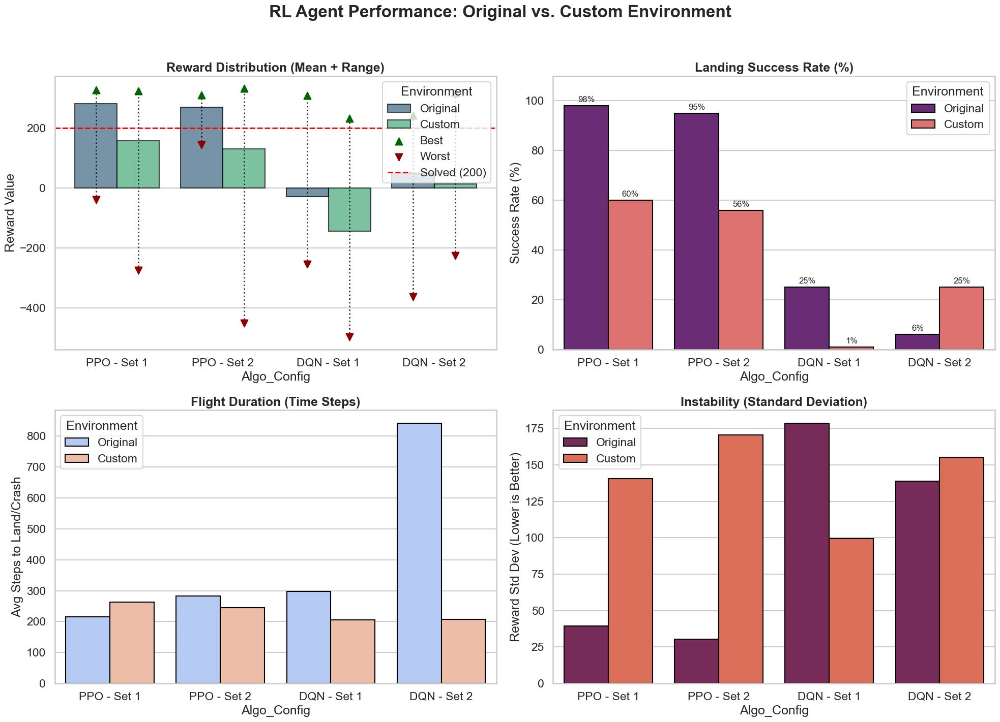

In [28]:
# Prepare Data
df_plot = df_summary.copy()
df_plot['Algo_Config'] = df_plot['Algorithm'] + " - Set " + df_plot['Settings'].astype(str)
algo_order = ['PPO - Set 1', 'PPO - Set 2', 'DQN - Set 1', 'DQN - Set 2']
env_order = ['Original', 'Custom'] 

# Setup Canvas
sns.set_theme(style="whitegrid", context="talk")
fig, axes = plt.subplots(2, 2, figsize=(20, 14))
plt.suptitle("RL Agent Performance: Original vs. Custom Environment", fontsize=24, weight='bold', y=1.02)

# Plot A: Mean Reward + Range
ax_reward = axes[0, 0]

sns.barplot(
    data=df_plot,
    x="Algo_Config",
    y="Mean Reward Val",
    hue="Environment",
    palette="viridis",
    order=algo_order,      
    hue_order=env_order,   
    ax=ax_reward,
    edgecolor="black",
    alpha=0.7
)

for i, container in enumerate(ax_reward.containers):
    env_name = env_order[i]
    
    for j, bar in enumerate(container):
        algo_name = algo_order[j]
        
        row = df_plot[(df_plot['Algo_Config'] == algo_name) & (df_plot['Environment'] == env_name)]
        
        if not row.empty:
            row = row.iloc[0]
            x = bar.get_x() + bar.get_width() / 2
            best = row['Best Reward']
            worst = row['Worst Reward']
            
            #  Draw Dotted Line (Range)
            ax_reward.vlines(x, worst, best, color='black', linestyles=':', linewidth=2, alpha=0.8)
            
            # Plot Markers
            show_label = (i == 0 and j == 0)
            ax_reward.scatter(x, best, marker='^', color='darkgreen', s=100, zorder=3, label='Best' if show_label else "")
            ax_reward.scatter(x, worst, marker='v', color='darkred', s=100, zorder=3, label='Worst' if show_label else "")

ax_reward.set_title("Reward Distribution (Mean + Range)", fontsize=18, weight='bold')
ax_reward.set_ylabel("Reward Value")
ax_reward.axhline(200, color='red', linestyle='--', linewidth=2, label='Solved (200)')
ax_reward.legend(title='Environment', loc='upper right')


# Plot B: Success Rate
sns.barplot(
    data=df_plot,
    x="Algo_Config",
    y="Success Rate (%)",
    hue="Environment",
    palette="magma",
    order=algo_order,    
    hue_order=env_order,
    ax=axes[0, 1],
    edgecolor="black"
)
axes[0, 1].set_title("Landing Success Rate (%)", fontsize=18, weight='bold')
axes[0, 1].set_ylabel("Success Rate (%)")
axes[0, 1].set_ylim(0, 110)
for container in axes[0, 1].containers:
    axes[0, 1].bar_label(container, fmt='%.0f%%', padding=3, fontsize=12)


# Plot C: Landing Efficiency
sns.barplot(
    data=df_plot,
    x="Algo_Config",
    y="Mean Length",
    hue="Environment",
    palette="coolwarm",
    order=algo_order,     
    hue_order=env_order,
    ax=axes[1, 0],
    edgecolor="black"
)
axes[1, 0].set_title("Flight Duration (Time Steps)", fontsize=18, weight='bold')
axes[1, 0].set_ylabel("Avg Steps to Land/Crash")


# Plot D: Stability Analysis
sns.barplot(
    data=df_plot,
    x="Algo_Config",
    y="Std Reward",
    hue="Environment",
    palette="rocket",
    order=algo_order,      
    hue_order=env_order,
    ax=axes[1, 1],
    edgecolor="black"
)
axes[1, 1].set_title("Instability (Standard Deviation)", fontsize=18, weight='bold')
axes[1, 1].set_ylabel("Reward Std Dev (Lower is Better)")

plt.tight_layout()
plt.show()

### **Flight Behaviour Analysis**

In this section, we move from **quantitative metrics to qualitative analysis by visualizing the agents in action**.

We will **record and compare the Original and Custom agents side-by-side to observe specific behaviors**:

- **Fuel Management:** We will **observe whether the custom agent conserves fuel by gliding**, in contrast to the **baseline's tendency to burn resources aggressively**.

- **Wind & Turbulence Handling:** We will **evaluate the stability of the landing approach when the agent is subjected to randomized wind vectors and turbulence**.

- **Safe Landing:** We will **verify if action masking effectively prevents the agent from attempting to fire empty thrusters** and assess if the agent can **execute a safe "dead-stick" landing (gliding to the ground) if fuel is depleted**.

The following code generates **paired GIFs for each model configuration (Baseline vs. Tuned) to make these behavioral differences immediately apparent**.

In [ ]:
from Custom_Lunar_Lander import make_custom_env

os.makedirs("videos/combined", exist_ok=True)

# Define Model Registry
models_to_record = [
    # Group 1: PPO Baseline
    {"id": "ppo_base_orig", "name": "Original PPO (Base)", "path": "models/original/ppo_settings_1/best_model.zip", "algo": "PPO", "env": "original", "mask": False},
    {"id": "ppo_base_cust", "name": "Custom PPO (Base)",   "path": "models/custom/ppo_settings_1/best_model.zip",   "algo": "PPO", "env": "custom",   "mask": False},

    # Group 2: PPO Tuned
    {"id": "ppo_tune_orig", "name": "Original PPO (Tuned)", "path": "models/original/ppo_settings_2/best_model.zip", "algo": "PPO", "env": "original", "mask": False},
    {"id": "ppo_tune_cust", "name": "Custom PPO (Tuned)",   "path": "models/custom/ppo_settings_2/best_model.zip",   "algo": "PPO", "env": "custom",   "mask": True},

    # Group 3: DQN Baseline
    {"id": "dqn_base_orig", "name": "Original DQN (Base)", "path": "models/original/dqn_settings_1/best_model.zip", "algo": "DQN", "env": "original", "mask": False},
    {"id": "dqn_base_cust", "name": "Custom DQN (Base)",   "path": "models/custom/dqn_settings_1/best_model.zip",   "algo": "DQN", "env": "custom",   "mask": False},
    
    # Group 4: DQN Tuned
    {"id": "dqn_tune_orig", "name": "Original DQN (Tuned)", "path": "models/original/dqn_settings_2/best_model.zip", "algo": "DQN", "env": "original", "mask": False},
    {"id": "dqn_tune_cust", "name": "Custom DQN (Tuned)",   "path": "models/custom/dqn_settings_2/best_model.zip",   "algo": "DQN", "env": "custom",   "mask": False},
]

# Redefine safe mask function
def mask_fn(env):
    """
    Manually checks fuel level to generate action mask.
    Action 0: Do Nothing | Action 1-3: Engines
    """
    # Use getattr to safely handle unwrapped/wrapped envs
    current_fuel = getattr(env.unwrapped, "current_fuel", 1000.0) 
    if current_fuel <= 0:
        return [True, False, False, False]
    return [True, True, True, True]

# Record Function
def record_episode_frames(agent_conf):
    """Records frames for a single agent."""
    
    # Initialize Environment
    if agent_conf['env'] == 'original':
        env = gym.make("LunarLander-v3", render_mode="rgb_array")
    else:
        env = make_custom_env(render_mode="rgb_array")
        
    # Apply Mask Wrapper if needed
    if agent_conf['mask']:
        env = ActionMasker(env, mask_fn)

    # Load Model
    try:
        if agent_conf['algo'] == 'PPO':
            if agent_conf['mask']:
                model = MaskablePPO.load(agent_conf['path'])
            else:
                model = PPO.load(agent_conf['path'])
        else:
            model = DQN.load(agent_conf['path'])
    except Exception as e:
        print(f"  [Error] Could not load {agent_conf['name']}: {e}")
        try: env.close() 
        except: pass
        return []

    # Run Episode
    obs, _ = env.reset(seed=42)
    frames = []
    done = False
    
    while not done:
        frames.append(env.render())
        
        if agent_conf['mask']:
            action_masks = mask_fn(env)
            action, _ = model.predict(obs, action_masks=action_masks, deterministic=True)
        else:
            action, _ = model.predict(obs, deterministic=True)
            
        obs, _, terminated, truncated, _ = env.step(action)
        done = terminated or truncated

    env.close()
    return frames

# Creating GIF's
def make_side_by_side_gif(left_conf, right_conf, base_name):
    """Stitches two frame lists side-by-side into one GIF."""
    print(f"Processing: {base_name}...")
    frames_left = record_episode_frames(left_conf)
    frames_right = record_episode_frames(right_conf)
    
    print(f"  -> Frames Left: {len(frames_left)} | Frames Right: {len(frames_right)}")

    if not frames_left or not frames_right:
        print(f"  [Skipping] Missing frames for {base_name}.")
        return None

    # Determine max length
    max_len = max(len(frames_left), len(frames_right))
    
    combined_frames = []
    for i in range(max_len):
        idx_l = min(i, len(frames_left) - 1)
        idx_r = min(i, len(frames_right) - 1)
        
        img_l = frames_left[idx_l]
        img_r = frames_right[idx_r]
        
        # Add a white separator line
        separator = np.ones((img_l.shape[0], 10, 3), dtype=np.uint8) * 255
        
        # Stitch: Left Image | Separator | Right Image
        stitched = np.hstack((img_l, separator, img_r))
        combined_frames.append(stitched)
        
    # Timestamp to prevent browser caching
    timestamp = int(time.time())
    out_path = f"videos/combined/{base_name}_{timestamp}.gif"
    
    imageio.mimsave(out_path, combined_frames, fps=50, loop=0)
    
    return out_path

# Generate Paired GIFs
pairs = [
    (models_to_record[0], models_to_record[1], "1_PPO_Baseline"),
    (models_to_record[2], models_to_record[3], "2_PPO_Tuned"),
    (models_to_record[4], models_to_record[5], "3_DQN_Baseline"),
    (models_to_record[6], models_to_record[7], "4_DQN_Tuned"),
]

generated_gifs = []
for left, right, name in pairs:
    path = make_side_by_side_gif(left, right, name)
    if path:
        generated_gifs.append((name, path))

# Display Results
html_content = """<h2 style="text-align:center">Side-by-Side Comparisons</h2>
<p style="text-align:center">Left: Original | Right: Custom</p>
<div style="display: grid; grid-template-columns: 1fr 1fr; gap: 20px;">"""

for name, path in generated_gifs:
    clean_name = name.replace('_', ' ')
    html_content += f"""
    <div style="text-align: center; border: 1px solid #ccc; padding: 10px; background: #f9f9f9;">
        <div style="font-weight: bold; margin-bottom: 5px;">{clean_name}</div>
        <img src="{path}" style="width: 100%; border-radius: 4px; box-shadow: 0 2px 4px rgba(0,0,0,0.1);">
    </div>
    """
html_content += "</div>"

print("\nVisualization Complete. Displaying below:")
display(HTML(html_content))

Processing: 1_PPO_Baseline...


c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
c:\Users\pedro\Desktop\LunarLander\lunar_lander_venv\lib\site-packages\gymnasium\spaces\box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


  -> Frames Left: 216 | Frames Right: 409
Processing: 2_PPO_Tuned...
  -> Frames Left: 246 | Frames Right: 438
Processing: 3_DQN_Baseline...
  -> Frames Left: 559 | Frames Right: 133
Processing: 4_DQN_Tuned...
  -> Frames Left: 1000 | Frames Right: 249

Visualization Complete. Displaying below:


## **Conclusion**

In this project, we **developed a custom Lunar Lander environment with realistic physics** and performed a **comparative analysis of PPO and DQN**. By **analyzing Mean Rewards, Episode Length, and Success Rates**, we uncovered **distinct behavioral patterns in how different algorithms handle environmental complexity**.

1. **Algorithm Comparison: PPO vs. DQN**

    The data demonstrates that **PPO is strictly superior to DQN for this continuous control task across all metrics**.

    - **Reward Stability:** **PPO maintained high positive rewards in all scenarios (Best: 281.48)**, indicating it **consistently found the landing pad**. In contrast, **DQN struggled to converge, often yielding negative mean rewards (Worst: -143.66)**, reflecting a **failure to balance the landing bonus against penalties**.

    - **Efficiency (Episode Length):**

        - **PPO (Original Base) was the most efficient agent**, achieving a **98% success rate with an average flight time of just 214.7 steps. It learned to land quickly and decisively**.

        - **DQN (Original Tuned) exhibited a "safe but stalled" behavior**. While it **gathered positive rewards**, its **mean length ballooned to 842.1 steps with a poor success rate (6%)**. This suggests the **agent learned to hover to avoid crashing (maximizing survival time) but failed to commit to a landing**.


2. **The "Reality Gap": Impact of Custom Physics**

    **Transitioning to the Custom_Lunar_Lander environment significantly impacted performance**, quantifying the **difficulty of realistic flight**.

    - **Reward Collapse:** **PPO's mean reward dropped by nearly 45% (from ~281 to ~157)** when moving to the custom environment. This sharp decline **proves that the added penalties (fuel usage) and instability (wind) made the reward landscape much harder to traverse**.

    - **Crash Frequency:** The **Custom DQN (Base) agent** had a **short average length of 206.1 steps but a success rate of only 1%**. This **low length combined with failure indicates the agent was not landing fast, but rather crashing early, unable to counter the wind forces**.


3. **Hyperparameter Tuning Analysis**

    Contrary to expectation, **"tuning" did not always yield better agents**, **highlighting the sensitivity of RL training**.

    - **PPO Efficiency Loss:** Tuning the **PPO agent in the Original environment actually decreased efficiency**. The **"Tuned" model took significantly longer to land (282.9 steps) compared to the "Base" model (214.7 steps)** and achieved a **slightly lower reward**. This suggests the **tuned hyperparameters likely made the agent overly cautious, wasting fuel and time**.

    - **DQN Recovery:** However, **tuning was essential for DQN in the Custom environment, raising the success rate from 1% to 25%**. In this case, the **tuning provided the necessary exploration stability to function at all in the stochastic environment**.


**Summary:**

The **PPO Baseline is the most robust agent**. It strikes the **best balance between flight speed (Length), safety (Success), and fuel economy (Reward)**. The **introduction of the Custom Environment successfully broke the "perfect" agents**, proving that **managing limited fuel and unpredictable wind requires a more sophisticated policy than standard gym environments demand**.